✅ SAM importado correctamente
🚀 PROCESAMIENTO OPTIMIZADO: SAM + CONVEX HULL (VERSIÓN CORREGIDA)
📂 Carpeta de entrada: test-seg2
💾 Carpeta de salida: segmented_results-seg-fin
🎨 Formato de salida: black_bg
📐 Procesamiento SAM: 256x256
✂️  Crop final: 256x256
🔍 Diagnóstico visual: Activado

🔧 Inicializando SAM...
🔧 Usando dispositivo: cpu
📐 Tamaño de procesamiento SAM: 256x256
✅ Checkpoint ya existe: sam_vit_b.pth
✅ Modelo SAM cargado y configurado

📂 Procesando imágenes...
📁 Encontradas 32 imágenes

[1/32] rust2.jpg
  📏 Redimensionado: 557x400 → 256x256
🔍 Generando máscara con SAM...
  🔄 Escalando máscara a tamaño original...
  ✂️  Aplicando convex hull crop (versión CORREGIDA)...
  🔍 Visualización de diagnóstico guardada: diagnostic_visualizations\rust2_diagnostic.png
  💾 Guardado: segmented_rust2_crop.jpg
  ✅ Completado

[2/32] northern-9-.jpeg
  📏 Redimensionado: 403x403 → 256x256
🔍 Generando máscara con SAM...
  🔄 Escalando máscara a tamaño original...
  ✂️  Aplicando convex hull cr

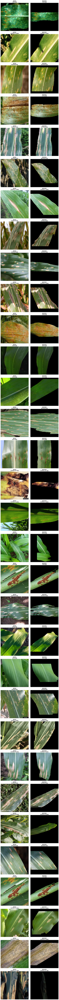

✅ Visualización completada para 32 imágenes

✅ PROCESAMIENTO COMPLETADO
💾 Resultados en: segmented_results-seg-fin
🔍 Visualizaciones de diagnóstico en: diagnostic_visualizations/

✅ Código CORREGIDO con Convex Hull sólido cargado
💡 Ejecuta main() para procesar y ver resultados
🔍 Las visualizaciones de diagnóstico te mostrarán el pipeline completo


In [1]:
# SAM Background Removal + Convex Hull para Imágenes de Hojas de Maíz
# Versión CORREGIDA: Convex Hull como máscara sólida + operaciones morfológicas

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import torch
from PIL import Image
import requests
from io import BytesIO

# Importar SAM
try:
    from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor
    print("✅ SAM importado correctamente")
except ImportError:
    print("❌ Error: Instala segment-anything con: pip install segment-anything")

class CornLeafSegmenter:
    def __init__(self, model_type="vit_b", checkpoint_path=None, processing_size=256):
        """
        Inicializa el segmentador de hojas de maíz usando SAM
        
        Args:
            model_type: Tipo de modelo SAM ("vit_h", "vit_l", "vit_b")
            checkpoint_path: Ruta al checkpoint de SAM
            processing_size: Tamaño para redimensionar antes de procesar (default: 256)
        """
        self.model_type = model_type
        self.device = "cuda" if torch.cuda.is_available() else "cpu"
        self.processing_size = processing_size
        print(f"🔧 Usando dispositivo: {self.device}")
        print(f"📐 Tamaño de procesamiento SAM: {processing_size}x{processing_size}")
        
        # Descargar y cargar modelo SAM
        if checkpoint_path is None:
            checkpoint_path = self.download_sam_checkpoint(model_type)
        
        self.sam = sam_model_registry[model_type](checkpoint=checkpoint_path)
        self.sam.to(device=self.device)
        
        # Configurar generador automático de máscaras (ajustado para 256x256)
        self.mask_generator = SamAutomaticMaskGenerator(
            model=self.sam,
            points_per_side=16,
            pred_iou_thresh=0.7,
            stability_score_thresh=0.8,
            crop_n_layers=1,
            crop_n_points_downscale_factor=2,
            min_mask_region_area=100
        )
        
        print("✅ Modelo SAM cargado y configurado")
    
    def download_sam_checkpoint(self, model_type):
        """Descarga el checkpoint de SAM si no existe"""
        checkpoints = {
            "vit_h": "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth",
            "vit_l": "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_l_0b3195.pth",
            "vit_b": "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth"
        }
        
        checkpoint_name = f"sam_{model_type}.pth"
        
        if not os.path.exists(checkpoint_name):
            print(f"📥 Descargando checkpoint SAM {model_type}...")
            response = requests.get(checkpoints[model_type])
            with open(checkpoint_name, 'wb') as f:
                f.write(response.content)
            print(f"✅ Checkpoint descargado: {checkpoint_name}")
        else:
            print(f"✅ Checkpoint ya existe: {checkpoint_name}")
        
        return checkpoint_name
    
    def load_and_resize_image(self, image_path):
        """
        Carga una imagen y la redimensiona al tamaño de procesamiento
        Retorna tanto la imagen original como la redimensionada
        """
        # Cargar imagen original
        image_original = cv2.imread(str(image_path))
        if image_original is None:
            raise ValueError(f"No se pudo cargar la imagen: {image_path}")
        
        image_original = cv2.cvtColor(image_original, cv2.COLOR_BGR2RGB)
        original_shape = image_original.shape[:2]
        
        # Redimensionar para procesamiento con SAM
        image_resized = cv2.resize(
            image_original, 
            (self.processing_size, self.processing_size),
            interpolation=cv2.INTER_AREA
        )
        
        print(f"  📏 Redimensionado: {original_shape[1]}x{original_shape[0]} → {self.processing_size}x{self.processing_size}")
        
        return image_original, image_resized, original_shape
    
    def resize_mask_to_original(self, mask, original_shape):
        """Redimensiona la máscara al tamaño original de la imagen"""
        mask_resized = cv2.resize(
            mask.astype(np.uint8),
            (original_shape[1], original_shape[0]),
            interpolation=cv2.INTER_NEAREST
        )
        return mask_resized.astype(bool)
    
    def find_leaf_mask(self, masks):
        """Encuentra la máscara de la hoja principal"""
        if not masks:
            return None
        
        masks_sorted = sorted(masks, key=lambda x: x['area'], reverse=True)
        
        for mask_info in masks_sorted:
            mask = mask_info['segmentation']
            area = mask_info['area']
            
            h, w = mask.shape
            total_pixels = h * w
            
            if area < 0.1 * total_pixels or area > 0.8 * total_pixels:
                continue
            
            border_pixels = np.sum(mask[0, :]) + np.sum(mask[-1, :]) + \
                           np.sum(mask[:, 0]) + np.sum(mask[:, -1])
            if border_pixels > 0.3 * area:
                continue
            
            return mask
        
        return masks_sorted[0]['segmentation'] if masks_sorted else None
    
    def create_convex_hull_mask(self, sam_mask, apply_morphology=True):
        """
        NUEVA FUNCIÓN: Crea una máscara sólida basada en el Convex Hull
        
        Args:
            sam_mask: Máscara binaria de SAM (puede tener huecos)
            apply_morphology: Si True, aplica operaciones morfológicas para refinar
            
        Returns:
            convex_mask: Máscara sólida sin huecos
            hull: Puntos del convex hull
            contour: Contorno original
        """
        # 1. Encontrar contorno exterior de la máscara SAM
        contours, _ = cv2.findContours(
            sam_mask.astype(np.uint8), 
            cv2.RETR_EXTERNAL, 
            cv2.CHAIN_APPROX_SIMPLE
        )
        
        if not contours:
            return None, None, None
        
        # Seleccionar el contorno más grande
        leaf_contour = max(contours, key=cv2.contourArea)
        
        # 2. Calcular Convex Hull del contorno
        hull = cv2.convexHull(leaf_contour)
        
        # 3. Crear una NUEVA máscara rellenando el interior del Convex Hull
        convex_mask = np.zeros_like(sam_mask, dtype=np.uint8)
        cv2.fillPoly(convex_mask, [hull], 1)  # ← CLAVE: rellena el polígono convexo
        
        # 4. Aplicar operaciones morfológicas para refinar
        if apply_morphology:
            # MORPH_CLOSE: Cierra pequeños huecos y suaviza bordes
            kernel_close = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (11, 11))
            convex_mask = cv2.morphologyEx(convex_mask, cv2.MORPH_CLOSE, kernel_close)
            
            # MORPH_OPEN: Elimina ruido pequeño
            kernel_open = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
            convex_mask = cv2.morphologyEx(convex_mask, cv2.MORPH_OPEN, kernel_open)
            
            # Asegurar que solo quede la componente conectada más grande
            num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(
                convex_mask, connectivity=8
            )
            
            if num_labels > 1:  # 0 es el fondo
                # Encontrar la componente más grande (excluyendo el fondo)
                largest_component = 1 + np.argmax(stats[1:, cv2.CC_STAT_AREA])
                convex_mask = (labels == largest_component).astype(np.uint8)
        
        return convex_mask, hull, leaf_contour
    
    def get_convex_hull_info(self, convex_mask, hull, contour):
        """
        FUNCIÓN ACTUALIZADA: Calcula información del convex hull
        
        Args:
            convex_mask: Máscara convexa sólida
            hull: Puntos del convex hull
            contour: Contorno original de SAM
            
        Returns:
            dict con información del hull
        """
        # Calcular momentos del hull para obtener el centroide
        M = cv2.moments(hull)
        
        if M['m00'] == 0:
            return None
        
        cx = int(M['m10'] / M['m00'])
        cy = int(M['m01'] / M['m00'])
        
        # Áreas
        hull_area = cv2.contourArea(hull)
        real_area = np.sum(convex_mask > 0)
        
        # Bounding box del hull (no del contorno original)
        x, y, w, h = cv2.boundingRect(hull)
        bbox_area = w * h
        
        return {
            'hull': hull,
            'contour': contour,
            'centroid': (cx, cy),
            'hull_area': hull_area,
            'real_area': real_area,
            'bbox_area': bbox_area,
            'bbox': (x, y, w, h),
            'efficiency': real_area / hull_area if hull_area > 0 else 0
        }
    
    def crop_with_convex_hull(self, image, sam_mask, margin_percent=0.05, 
                              target_size=256, padding_color=(0, 0, 0)):
        """
        FUNCIÓN CORREGIDA: Recorta basándose en el Convex Hull SÓLIDO
        
        Args:
            image: Imagen RGB original
            sam_mask: Máscara de SAM (puede tener huecos)
            margin_percent: Margen adicional alrededor del bbox
            target_size: Tamaño final de la imagen
            padding_color: Color del padding
            
        Returns:
            cropped_image: Imagen recortada con fondo eliminado
            cropped_mask: Máscara sólida recortada
            hull_info: Información del convex hull
        """
        # 1. Crear máscara convexa SÓLIDA
        convex_mask, hull, contour = self.create_convex_hull_mask(
            sam_mask, 
            apply_morphology=True
        )
        
        if convex_mask is None or hull is None:
            print("⚠️  No se pudo crear la máscara convexa")
            return None, None, None
        
        # 2. Obtener información del hull
        hull_info = self.get_convex_hull_info(convex_mask, hull, contour)
        
        if hull_info is None:
            print("⚠️  No se pudo calcular información del hull")
            return None, None, None
        
        # 3. Calcular bbox con margen (del HULL, no del contorno original)
        x, y, w, h = hull_info['bbox']
        
        margin_x = int(w * margin_percent)
        margin_y = int(h * margin_percent)
        
        x_start = max(0, x - margin_x)
        y_start = max(0, y - margin_y)
        x_end = min(image.shape[1], x + w + margin_x)
        y_end = min(image.shape[0], y + h + margin_y)
        
        # 4. Recortar imagen y MÁSCARA CONVEXA SÓLIDA (no la de SAM)
        cropped_image = image[y_start:y_end, x_start:x_end].copy()
        cropped_mask = convex_mask[y_start:y_end, x_start:x_end]
        
        # 5. Aplicar la máscara sólida para eliminar el fondo
        cropped_image[cropped_mask == 0] = padding_color
        
        # 6. Resize manteniendo aspect ratio
        h_crop, w_crop = cropped_image.shape[:2]
        scale = min(target_size / w_crop, target_size / h_crop)
        
        new_w = int(w_crop * scale)
        new_h = int(h_crop * scale)
        
        resized_image = cv2.resize(cropped_image, (new_w, new_h), interpolation=cv2.INTER_LINEAR)
        resized_mask = cv2.resize(cropped_mask.astype(np.uint8), (new_w, new_h), interpolation=cv2.INTER_NEAREST)
        
        # 7. Padding a target_size x target_size
        final_image = np.full((target_size, target_size, 3), padding_color, dtype=image.dtype)
        final_mask = np.zeros((target_size, target_size), dtype=np.uint8)
        
        y_offset = (target_size - new_h) // 2
        x_offset = (target_size - new_w) // 2
        
        final_image[y_offset:y_offset+new_h, x_offset:x_offset+new_w] = resized_image
        final_mask[y_offset:y_offset+new_h, x_offset:x_offset+new_w] = resized_mask
        
        return final_image, final_mask.astype(bool), hull_info
    
    def segment_leaf(self, image_path, output_format='black_bg', 
                    use_convex_hull_crop=True, crop_size=256,
                    save_debug_visualization=False):
        """
        Segmenta la hoja de una imagen
        
        Args:
            image_path: Ruta a la imagen
            output_format: 'black_bg', 'white_bg', o 'transparent'
            use_convex_hull_crop: Si True, aplica convex hull crop
            crop_size: Tamaño final del crop
            save_debug_visualization: Si True, guarda visualización de diagnóstico
        """
        image_original, image_resized, original_shape = self.load_and_resize_image(image_path)
        
        print(f"🔍 Generando máscara con SAM...")
        masks = self.mask_generator.generate(image_resized)
        
        leaf_mask_small = self.find_leaf_mask(masks)
        
        if leaf_mask_small is None:
            print(f"⚠️  No se encontró una hoja válida")
            return {
                'success': False,
                'filename': Path(image_path).name,
                'error': 'No se encontró máscara válida'
            }
        
        print(f"  🔄 Escalando máscara a tamaño original...")
        leaf_mask_full = self.resize_mask_to_original(leaf_mask_small, original_shape)
        
        h, w = image_original.shape[:2]
        
        if output_format == 'transparent':
            segmented = np.zeros((h, w, 4), dtype=np.uint8)
            segmented[leaf_mask_full] = np.concatenate([image_original[leaf_mask_full], 
                                                        np.full((np.sum(leaf_mask_full), 1), 255)], axis=1)
        elif output_format == 'white_bg':
            segmented = np.ones_like(image_original) * 255
            segmented[leaf_mask_full] = image_original[leaf_mask_full]
        elif output_format == 'black_bg':
            segmented = np.zeros_like(image_original)
            segmented[leaf_mask_full] = image_original[leaf_mask_full]
        else:
            raise ValueError("output_format debe ser 'transparent', 'white_bg', or 'black_bg'")
        
        result = {
            'success': True,
            'filename': Path(image_path).name,
            'original': image_original,
            'segmented_full': segmented,
            'mask_full': leaf_mask_full
        }
        
        if use_convex_hull_crop:
            if output_format == 'white_bg':
                padding_color = (255, 255, 255)
            else:
                padding_color = (0, 0, 0)
            
            print(f"  ✂️  Aplicando convex hull crop (versión CORREGIDA)...")
            cropped_img, cropped_mask, hull_info = self.crop_with_convex_hull(
                segmented, leaf_mask_full, 
                margin_percent=0.05,
                target_size=crop_size,
                padding_color=padding_color
            )
            
            if cropped_img is not None:
                result.update({
                    'segmented_cropped': cropped_img,
                    'mask_cropped': cropped_mask,
                    'hull_info': hull_info,
                    'centroid': hull_info['centroid'],
                    'hull_area': hull_info['hull_area'],
                    'real_area': hull_info['real_area'],
                    'efficiency': hull_info['efficiency']
                })
                
                # Guardar visualización de diagnóstico si se solicita
                if save_debug_visualization:
                    self.save_diagnostic_visualization(result, image_path)
            else:
                print(f"⚠️  No se pudo calcular convex hull")
                result['convex_hull_failed'] = True
        
        return result
    
    def save_diagnostic_visualization(self, result, image_path):
        """
        Guarda una visualización de diagnóstico mostrando el pipeline completo
        """
        output_path = Path("diagnostic_visualizations")
        output_path.mkdir(exist_ok=True)
        
        filename = Path(image_path).stem
        
        # Crear figura con 5 subplots
        fig, axes = plt.subplots(1, 5, figsize=(25, 5))
        
        # 1. Original
        axes[0].imshow(result['original'])
        axes[0].set_title('1. Original', fontsize=12, fontweight='bold')
        axes[0].axis('off')
        
        # 2. Máscara SAM (puede tener huecos)
        axes[1].imshow(result['mask_full'], cmap='gray')
        axes[1].set_title('2. Máscara SAM\n(puede tener huecos)', fontsize=12, fontweight='bold')
        axes[1].axis('off')
        
        # 3. Máscara Convexa (sólida)
        if 'mask_cropped' in result:
            # Para visualización, crear una máscara del tamaño completo
            axes[2].imshow(result['mask_cropped'], cmap='gray')
            axes[2].set_title('3. Máscara Convexa\n(sólida, sin huecos)', fontsize=12, fontweight='bold')
            axes[2].axis('off')
        
        # 4. Segmentación completa
        axes[3].imshow(result['segmented_full'])
        axes[3].set_title('4. Segmentación Completa', fontsize=12, fontweight='bold')
        axes[3].axis('off')
        
        # 5. Recorte final
        if 'segmented_cropped' in result:
            axes[4].imshow(result['segmented_cropped'])
            axes[4].set_title('5. Recorte Final\n(256x256)', fontsize=12, fontweight='bold')
            axes[4].axis('off')
        
        plt.tight_layout()
        
        save_path = output_path / f"{filename}_diagnostic.png"
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
        plt.close()
        
        print(f"  🔍 Visualización de diagnóstico guardada: {save_path}")
    
    def process_folder(self, input_folder, output_folder=None, output_format='black_bg',
                      use_convex_hull_crop=True, crop_size=256,
                      max_images=None, show_results=False, save_visualizations=False,
                      show_before_after=True, save_debug=False):
        """Procesa todas las imágenes de una carpeta"""
        input_path = Path(input_folder)
        
        if not input_path.exists():
            raise ValueError(f"La carpeta {input_folder} no existe")
        
        image_extensions = ['*.jpg', '*.jpeg', '*.png', '*.bmp', '*.tiff']
        image_files = []
        for ext in image_extensions:
            image_files.extend(input_path.glob(ext))
            image_files.extend(input_path.glob(ext.upper()))
        
        image_files = list(set(image_files))
        
        if not image_files:
            print(f"❌ No se encontraron imágenes en {input_folder}")
            return
        
        print(f"📁 Encontradas {len(image_files)} imágenes")
        
        if max_images is not None:
            image_files = image_files[:max_images]
            print(f"📊 Procesando las primeras {len(image_files)} imágenes")
        
        if output_folder:
            output_path = Path(output_folder)
            output_path.mkdir(parents=True, exist_ok=True)
            
            if save_visualizations:
                viz_path = output_path / "visualizations"
                viz_path.mkdir(exist_ok=True)
        
        # Almacenar resultados para visualización
        results = []
        visualization_data = []
        
        for i, image_file in enumerate(image_files):
            try:
                print(f"\n{'='*60}")
                print(f"[{i+1}/{len(image_files)}] {image_file.name}")
                print(f"{'='*60}")
                
                result = self.segment_leaf(
                    image_file, 
                    output_format=output_format,
                    use_convex_hull_crop=use_convex_hull_crop,
                    crop_size=crop_size,
                    save_debug_visualization=save_debug
                )
                
                if not result['success']:
                    results.append(result)
                    continue
                
                # Guardar imágenes para visualización antes/después
                if show_before_after and 'segmented_cropped' in result:
                    # Redimensionar original al mismo tamaño del crop para comparación
                    original_resized = cv2.resize(result['original'], 
                                                 (crop_size, crop_size),
                                                 interpolation=cv2.INTER_AREA)
                    visualization_data.append({
                        'filename': result['filename'],
                        'before': original_resized,
                        'after': result['segmented_cropped']
                    })
                
                # Guardar resultados
                if output_folder:
                    output_name = f"segmented_{image_file.stem}"
                    
                    if 'segmented_cropped' in result:
                        if output_format == 'transparent':
                            output_file_crop = output_path / f"{output_name}_crop.png"
                            pil_image = Image.fromarray(result['segmented_cropped'], 'RGBA')
                            pil_image.save(output_file_crop)
                        else:
                            output_file_crop = output_path / f"{output_name}_crop.jpg"
                            cv2.imwrite(str(output_file_crop), 
                                       cv2.cvtColor(result['segmented_cropped'], cv2.COLOR_RGB2BGR))
                        print(f"  💾 Guardado: {output_file_crop.name}")
                    
                    if save_visualizations and 'hull_info' in result:
                        viz_image = result['original'].copy()
                        hull_info = result['hull_info']
                        
                        x, y, w, h = hull_info['bbox']
                        cv2.rectangle(viz_image, (x, y), (x+w, y+h), (255, 0, 0), 3)
                        cv2.drawContours(viz_image, [hull_info['hull']], 0, (0, 255, 0), 3)
                        cx, cy = hull_info['centroid']
                        cv2.circle(viz_image, (cx, cy), 15, (0, 0, 255), -1)
                        
                        viz_file = viz_path / f"{output_name}_analysis.jpg"
                        cv2.imwrite(str(viz_file), cv2.cvtColor(viz_image, cv2.COLOR_RGB2BGR))
                
                results.append({
                    'success': True,
                    'filename': result['filename'],
                    'centroid': result.get('centroid'),
                    'hull_area': result.get('hull_area'),
                    'real_area': result.get('real_area'),
                    'efficiency': result.get('efficiency')
                })
                
                print(f"  ✅ Completado")
                
                del result
                import gc
                gc.collect()
                
            except Exception as e:
                print(f"  ❌ Error: {str(e)}")
                results.append({
                    'filename': image_file.name,
                    'success': False,
                    'error': str(e)
                })
                
                import gc
                gc.collect()
        
        if show_results:
            self.print_statistics(results)
        
        # Mostrar visualización antes/después
        if show_before_after and visualization_data:
            self.show_before_after_comparison(visualization_data)
        
        return results
    
    def show_before_after_comparison(self, visualization_data):
        """Muestra comparación antes/después de todas las imágenes"""
        print(f"\n{'='*70}")
        print(f"📸 MOSTRANDO COMPARACIÓN ANTES/DESPUÉS")
        print(f"{'='*70}")
        
        n_images = len(visualization_data)
        
        # Crear figura con 2 columnas (antes y después)
        fig, axes = plt.subplots(n_images, 2, figsize=(10, 5*n_images))
        
        # Si solo hay una imagen, convertir axes a array 2D
        if n_images == 1:
            axes = axes.reshape(1, -1)
        
        for i, data in enumerate(visualization_data):
            # Antes (original)
            axes[i, 0].imshow(data['before'])
            axes[i, 0].set_title(f"ANTES\n{data['filename']}", fontsize=10, fontweight='bold')
            axes[i, 0].axis('off')
            
            # Después (segmentado)
            axes[i, 1].imshow(data['after'])
            axes[i, 1].set_title(f"DESPUÉS\n{data['filename']}", fontsize=10, fontweight='bold')
            axes[i, 1].axis('off')
        
        plt.tight_layout()
        plt.show()
        
        print(f"✅ Visualización completada para {n_images} imágenes")
    
    def print_statistics(self, results):
        """Imprime estadísticas del procesamiento"""
        total_processed = len(results)
        successful_results = [r for r in results if r['success']]
        failed_results = [r for r in results if not r['success']]
        
        successful = len(successful_results)
        failed = len(failed_results)
        
        print(f"\n{'='*70}")
        print(f"📈 ESTADÍSTICAS DEL PROCESAMIENTO:")
        print(f"{'='*70}")
        print(f"   • Total de imágenes: {total_processed}")
        print(f"   • Exitosas: {successful} ({successful/total_processed*100:.1f}%)")
        print(f"   • Fallidas: {failed} ({failed/total_processed*100:.1f}%)")
        
        if successful_results:
            hull_results = [r for r in successful_results if 'hull_area' in r and r['hull_area'] is not None]
            
            if hull_results:
                areas_real = [r['real_area'] for r in hull_results]
                areas_hull = [r['hull_area'] for r in hull_results]
                efficiencies = [r['efficiency'] for r in hull_results]
                
                print(f"\n📐 ESTADÍSTICAS DE CONVEX HULL:")
                print(f"{'='*70}")
                print(f"   • Área real promedio: {np.mean(areas_real):.0f} ± {np.std(areas_real):.0f} px²")
                print(f"   • Área hull promedio: {np.mean(areas_hull):.0f} ± {np.std(areas_hull):.0f} px²")
                print(f"   • Eficiencia promedio: {np.mean(efficiencies):.2%} ± {np.std(efficiencies):.2%}")
        
        if failed > 0:
            print(f"\n❌ IMÁGENES FALLIDAS:")
            print(f"{'='*70}")
            for result in failed_results:
                print(f"   • {result['filename']}: {result.get('error', 'Error desconocido')}")

# =============================================================================
# EJEMPLO DE USO
# =============================================================================

def main():
    """Función principal con pipeline corregido"""
    
    INPUT_FOLDER = "test-seg2"
    OUTPUT_FOLDER = "segmented_results-seg-fin"
    OUTPUT_FORMAT = "black_bg"
    USE_CONVEX_HULL = True
    CROP_SIZE = 256
    PROCESSING_SIZE = 256
    MAX_IMAGES = None
    SAVE_VISUALIZATIONS = False
    SHOW_BEFORE_AFTER = True
    SAVE_DEBUG = True  # ← NUEVO: Guarda visualizaciones de diagnóstico
    
    print("🚀 PROCESAMIENTO OPTIMIZADO: SAM + CONVEX HULL (VERSIÓN CORREGIDA)")
    print("=" * 70)
    print(f"📂 Carpeta de entrada: {INPUT_FOLDER}")
    print(f"💾 Carpeta de salida: {OUTPUT_FOLDER}")
    print(f"🎨 Formato de salida: {OUTPUT_FORMAT}")
    print(f"📐 Procesamiento SAM: {PROCESSING_SIZE}x{PROCESSING_SIZE}")
    print(f"✂️  Crop final: {CROP_SIZE}x{CROP_SIZE}")
    print(f"🔍 Diagnóstico visual: {'Activado' if SAVE_DEBUG else 'Desactivado'}")
    print("=" * 70)
    
    if not os.path.exists(INPUT_FOLDER):
        print(f"\n❌ La carpeta {INPUT_FOLDER} no existe")
        return
    
    try:
        print("\n🔧 Inicializando SAM...")
        segmenter = CornLeafSegmenter(
            model_type="vit_b",
            processing_size=PROCESSING_SIZE
        )
        
        print(f"\n📂 Procesando imágenes...")
        results = segmenter.process_folder(
            input_folder=INPUT_FOLDER,
            output_folder=OUTPUT_FOLDER,
            output_format=OUTPUT_FORMAT,
            use_convex_hull_crop=USE_CONVEX_HULL,
            crop_size=CROP_SIZE,
            max_images=MAX_IMAGES,
            show_results=True,
            save_visualizations=SAVE_VISUALIZATIONS,
            show_before_after=SHOW_BEFORE_AFTER,
            save_debug=SAVE_DEBUG
        )
        
        print(f"\n✅ PROCESAMIENTO COMPLETADO")
        print(f"💾 Resultados en: {OUTPUT_FOLDER}")
        if SAVE_DEBUG:
            print(f"🔍 Visualizaciones de diagnóstico en: diagnostic_visualizations/")
        
    except Exception as e:
        print(f"\n❌ Error: {str(e)}")
        import traceback
        traceback.print_exc()

if __name__ == "__main__":
    main()

print("\n✅ Código CORREGIDO con Convex Hull sólido cargado")
print("💡 Ejecuta main() para procesar y ver resultados")
print("🔍 Las visualizaciones de diagnóstico te mostrarán el pipeline completo")